In [7]:
import datashader as ds
import datashader.transfer_functions as tf
import datashader.glyphs
from datashader import reductions
from datashader.core import bypixel
from datashader.utils import lnglat_to_meters as webm, export_image
from datashader.colors import colormap_select, Greys9, viridis, inferno
import copy


from pyproj import Proj, transform
import numpy as np
import pandas as pd
import urllib
import json
import datetime
import colorlover as cl

import plotly.offline as py
import plotly.graph_objs as go
from plotly import tools

#from shapely.geometry import Point, Polygon, shape
from shapely.geometry import Point, Polygon, shape
# In order to get shapley, you'll need to run [pip install shapely.geometry] from your terminal

from functools import partial

from IPython.display import GeoJSON

py.init_notebook_mode()

For module 2 we'll be looking at techniques for dealing with big data. In particular binning strategies and the datashader library (which possibly proves we'll never need to bin large data for visualization ever again.)

To demonstrate these concepts we'll be looking at the PLUTO dataset put out by New York City's department of city planning. PLUTO contains data about every tax lot in New York City.

PLUTO data can be downloaded from [here](https://www1.nyc.gov/site/planning/data-maps/open-data/dwn-pluto-mappluto.page). Unzip them to the same directory as this notebook, and you should be able to read them in using this (or very similar) code. Also take note of the data dictionary, it'll come in handy for this assignment.

In [8]:
import sys
import warnings

if not sys.warnoptions:
    warnings.simplefilter("ignore")

# Code to read in v17, column names have been updated (without upper case letters) for v18

# bk = pd.read_csv('PLUTO17v1.1/BK2017V11.csv')
# bx = pd.read_csv('PLUTO17v1.1/BX2017V11.csv')
# mn = pd.read_csv('PLUTO17v1.1/MN2017V11.csv')
# qn = pd.read_csv('PLUTO17v1.1/QN2017V11.csv')
# si = pd.read_csv('PLUTO17v1.1/SI2017V11.csv')

# ny = pd.concat([bk, bx, mn, qn, si], ignore_index=True)

ny = pd.read_csv('C:\\Users\\steph\\Documents\\DATA608\\module2\\pluto_20v1.csv')


# Getting rid of some outliers
ny = ny[(ny['yearbuilt'] > 1850) & (ny['yearbuilt'] < 2020) & (ny['numfloors'] != 0)]

I'll also do some prep for the geographic component of this data, which we'll be relying on for datashader.

You're not required to know how I'm retrieving the lattitude and longitude here, but for those interested: this dataset uses a flat x-y projection (assuming for a small enough area that the world is flat for easier calculations), and this needs to be projected back to traditional lattitude and longitude.

In [9]:


# wgs84 = Proj("+proj=longlat +ellps=GRS80 +datum=NAD83 +no_defs")
# nyli = Proj("+proj=lcc +lat_1=40.66666666666666 +lat_2=41.03333333333333 +lat_0=40.16666666666666 +lon_0=-74 +x_0=300000 +y_0=0 +ellps=GRS80 +datum=NAD83 +to_meter=0.3048006096012192 +no_defs")
# ny['xcoord'] = 0.3048*ny['xcoord']
# ny['ycoord'] = 0.3048*ny['ycoord']
# ny['lon'], ny['lat'] = transform(nyli, wgs84, ny['xcoord'].values, ny['ycoord'].values)

# ny = ny[(ny['lon'] < -60) & (ny['lon'] > -100) & (ny['lat'] < 60) & (ny['lat'] > 20)]

#Defining some helper functions for DataShader
background = "black"
export = partial(export_image, background = background, export_path="export")
cm = partial(colormap_select, reverse=(background!="black"))

## Part 1: Binning and Aggregation

Binning is a common strategy for visualizing large datasets. Binning is inherent to a few types of visualizations, such as histograms and [2D histograms](https://plot.ly/python/2D-Histogram/) (also check out their close relatives: [2D density plots](https://plot.ly/python/2d-density-plots/) and the more general form: [heatmaps](https://plot.ly/python/heatmaps/).

While these visualization types explicitly include binning, any type of visualization used with aggregated data can be looked at in the same way. For example, lets say we wanted to look at building construction over time. This would be best viewed as a line graph, but we can still think of our results as being binned by year:

In [10]:
trace = go.Scatter(
    # I'm choosing BBL here because I know it's a unique key.
    x = ny.groupby('yearbuilt').count()['bbl'].index,
    y = ny.groupby('yearbuilt').count()['bbl']
)

layout = go.Layout(
    xaxis = dict(title = 'Year Built'),
    yaxis = dict(title = 'Number of Lots Built')
)

fig = go.FigureWidget(data = [trace], layout = layout)

fig

FigureWidget({
    'data': [{'type': 'scatter',
              'uid': 'aea44e4f-faab-4de1-96ff-89c04f51e510',
 …

Something looks off... You're going to have to deal with this imperfect data to answer this first question. 

But first: some notes on pandas. Pandas dataframes are a different beast than R dataframes, here are some tips to help you get up to speed:

---

Hello all, here are some pandas tips to help you guys through this homework:

[Indexing and Selecting](https://pandas.pydata.org/pandas-docs/stable/indexing.html): .loc and .iloc are the analogs for base R subsetting, or filter() in dplyr

[Group By](https://pandas.pydata.org/pandas-docs/stable/groupby.html):  This is the pandas analog to group_by() and the appended function the analog to summarize(). Try out a few examples of this, and display the results in Jupyter. Take note of what's happening to the indexes, you'll notice that they'll become hierarchical. I personally find this more of a burden than a help, and this sort of hierarchical indexing leads to a fundamentally different experience compared to R dataframes. Once you perform an aggregation, try running the resulting hierarchical datafrome through a [reset_index()](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.reset_index.html).

[Reset_index](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.reset_index.html): I personally find the hierarchical indexes more of a burden than a help, and this sort of hierarchical indexing leads to a fundamentally different experience compared to R dataframes. reset_index() is a way of restoring a dataframe to a flatter index style. Grouping is where you'll notice it the most, but it's also useful when you filter data, and in a few other split-apply-combine workflows. With pandas indexes are more meaningful, so use this if you start getting unexpected results.

Indexes are more important in Pandas than in R. If you delve deeper into the using python for data science, you'll begin to see the benefits in many places (despite the personal gripes I highlighted above.) One place these indexes come in handy is with time series data. The pandas docs have a [huge section](http://pandas.pydata.org/pandas-docs/stable/timeseries.html) on datetime indexing. In particular, check out [resample](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.resample.html), which provides time series specific aggregation.

[Merging, joining, and concatenation](https://pandas.pydata.org/pandas-docs/stable/merging.html): There's some overlap between these different types of merges, so use this as your guide. Concat is a single function that replaces cbind and rbind in R, and the results are driven by the indexes. Read through these examples to get a feel on how these are performed, but you will have to manage your indexes when you're using these functions. Merges are fairly similar to merges in R, similarly mapping to SQL joins.

Apply: This is explained in the "group by" section linked above. These are your analogs to the plyr library in R. Take note of the lambda syntax used here, these are anonymous functions in python. Rather than predefining a custom function, you can just define it inline using lambda.

Browse through the other sections for some other specifics, in particular reshaping and categorical data (pandas' answer to factors.) Pandas can take a while to get used to, but it is a pretty strong framework that makes more advanced functions easier once you get used to it. Rolling functions for example follow logically from the apply workflow (and led to the best google results ever when I first tried to find this out and googled "pandas rolling")

Google Wes Mckinney's book "Python for Data Analysis," which is a cookbook style intro to pandas. It's an O'Reilly book that should be pretty available out there.

---

### Question

After a few building collapses, the City of New York is going to begin investigating older buildings for safety. The city is particularly worried about buildings that were unusually tall when they were built, since best-practices for safety hadn’t yet been determined. Create a graph that shows how many buildings of a certain number of floors were built in each year (note: you may want to use a log scale for the number of buildings). Find a strategy to bin buildings (It should be clear 20-29-story buildings, 30-39-story buildings, and 40-49-story buildings were first built in large numbers, but does it make sense to continue in this way as you get taller?)

In [11]:
# Start your answer here, inserting more cells as you go along
#for col in ny.columns: 
#    print(col)

#From the data dictionary.
#The number of full and partial stories starting from the ground floor, for the tallest
#building on the tax lot.
#Above ground basements are not included in the NUMBER OF FLOORS.
#A roof used for parking, farming, playground, etc. is not included in NUMBER OF
#FLOORS.
#If the NUMBER OF FLOORS is zero and the NUMBER OF BUILDINGS is greater
#than zero, then NUMBER OF FLOORS is not available for the tax lot.
#If the NUMBER OF FLOORS is zero and the NUMBER OF BUILDINGS is zero,
#then NUMBER OF FLOORS is not applicable for the tax lot.
    
#numfloors is the variable of interest
print("rows, columns: ",ny.shape)
print("mean floors: ",ny['numfloors'].mean())
print("median floors: ",ny['numfloors'].median())
print("minimum floors: ",ny['numfloors'].min())
print("maximum floors: ",ny['numfloors'].max())
print("earliest year built: ",ny['yearbuilt'].min())
print("latest year built: ",ny['yearbuilt'].max())

rows, columns:  (811684, 99)
mean floors:  2.4573344060000553
median floors:  2.0
minimum floors:  0.1
maximum floors:  205.0
earliest year built:  1851.0
latest year built:  2019.0


In [12]:
print("number of buildings with floors < 2:",sum(ny.numfloors < 2))
print("number of buildings with floors >= 2 and < 3:",sum((ny.numfloors < 3)&(ny.numfloors >= 2)))
print("number of buildings with floors >= 3 and < 4:",sum((ny.numfloors < 4)&(ny.numfloors >= 3)))
print("number of buildings with floors >= 4:",sum(ny.numfloors >= 4))

number of buildings with floors < 2: 111317
number of buildings with floors >= 2 and < 3: 511468
number of buildings with floors >= 3 and < 4: 120507
number of buildings with floors >= 4: 68392


In [13]:
ny['floorcat']= np.where(ny['numfloors'] < 2, 1, 0)
ny['floorcat']= np.where((ny['numfloors'] < 3) & (ny['numfloors'] >= 2), 2, ny['floorcat'])
ny['floorcat']= np.where((ny['numfloors'] < 4) & (ny['numfloors'] >= 3), 3, ny['floorcat'])
ny['floorcat']= np.where(ny['numfloors'] >= 4, 4, ny['floorcat'])

print(ny['floorcat'].value_counts())

2    511468
3    120507
1    111317
4     68392
Name: floorcat, dtype: int64


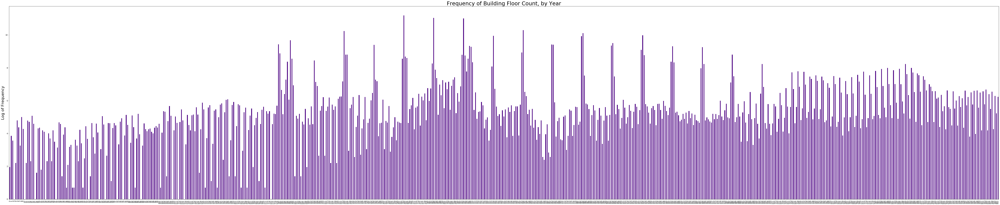

In [16]:

import matplotlib.pyplot as plt

df = ny.groupby(['yearbuilt','floorcat']).count().iloc[:,1:2]
df.columns = ['frequency']
df['log_freq'] = np.log(df['frequency'])

# setting first name as index column 
df = df.reset_index()

df2 = df.unstack()['log_freq']

#axes = plt.gca()
ax = df2.plot(kind='bar', figsize=(100,20), color="indigo");#, fontsize=13);
ax.set_alpha(0.8)

ax.set_title("Frequency of Building Floor Count, by Year", fontsize=30)
ax.set_ylabel("Log of Frequency", fontsize=22);
#ax.set_xlim(1851, 2019)

plt.xticks(rotation=90)
plt.show()


**<span style="font-size:22px;">1. Buildings, Floors by Category, per Year</span>**

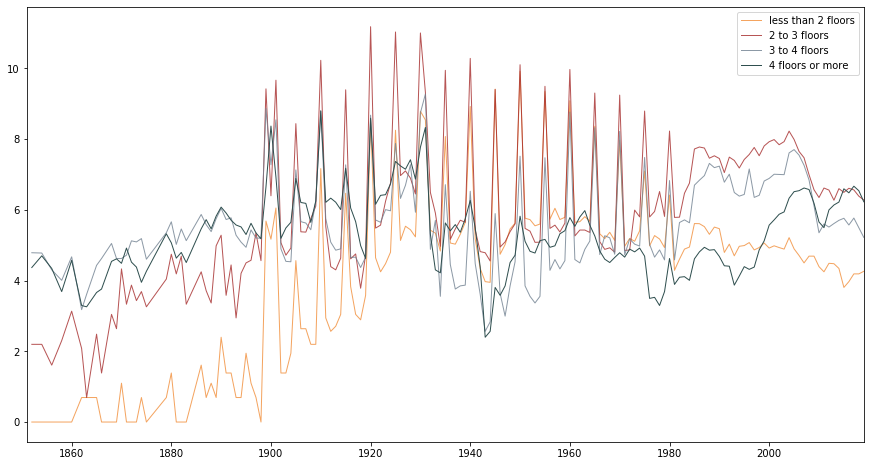

In [15]:

# multiple line plot
df_1 = pd.DataFrame({'year': df['yearbuilt'].loc[df['floorcat'] == 1], 'log_freq1': df['log_freq'].loc[df['floorcat'] == 1]})
df_2 = pd.DataFrame({'year': df['yearbuilt'].loc[df['floorcat'] == 2], 'log_freq2': df['log_freq'].loc[df['floorcat'] == 2]})
df_3 = pd.DataFrame({'year': df['yearbuilt'].loc[df['floorcat'] == 3], 'log_freq3': df['log_freq'].loc[df['floorcat'] == 3]})
df_4 = pd.DataFrame({'year': df['yearbuilt'].loc[df['floorcat'] == 4], 'log_freq4': df['log_freq'].loc[df['floorcat'] == 4]})

df_tot = df_1.merge(df_2, left_on='year', right_on='year')
df_tot = df_tot.merge(df_3, left_on='year', right_on='year')
df_tot = df_tot.merge(df_4, left_on='year', right_on='year')

# multiple line plot
plt.figure(figsize=(15,8))
plt.xlim(1851, 2019)
#plt.xticks(df_tot['year'], rotation=90, fontsize = 6)
plt.plot( 'year', 'log_freq1', data=df_tot, marker='', markerfacecolor='blue', markersize=5, color='#F4A460', alpha = 1.0, linewidth=1, label="less than 2 floors")
plt.plot( 'year', 'log_freq2', data=df_tot, marker='', markerfacecolor='blue', markersize=5, color='#A52A2A', alpha = 0.8, linewidth=1, label="2 to 3 floors")
plt.plot( 'year', 'log_freq3', data=df_tot, marker='', markerfacecolor='blue', markersize=5, color='#708090', alpha = 0.8, linewidth=1, label="3 to 4 floors")
plt.plot( 'year', 'log_freq4', data=df_tot, marker='', markerfacecolor='blue', markersize=5, color='#2F4F4F', alpha = 1.0, linewidth=1, label="4 floors or more")
plt.legend()


**<span style="font-size:22px;">2. Buildings, Floors by Category, per Year</span>**

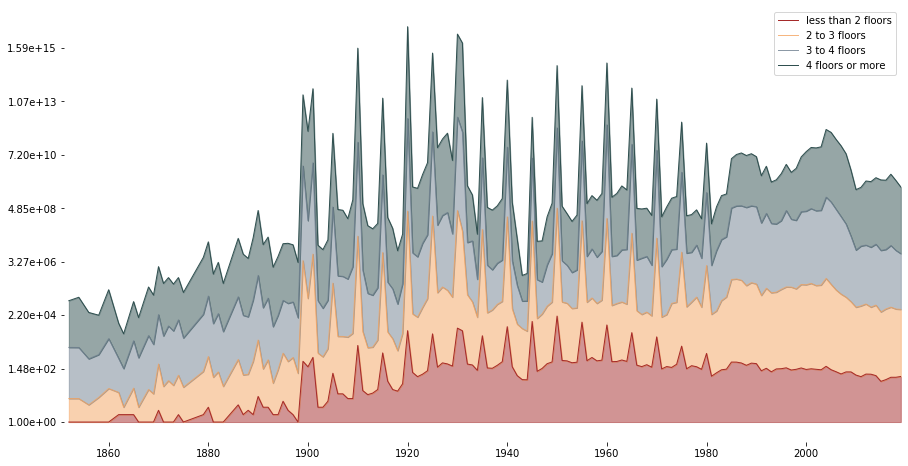

In [17]:
# multiple line plot
df_1 = pd.DataFrame({'year': df['yearbuilt'].loc[df['floorcat'] == 1], 'log_freq1': df['log_freq'].loc[df['floorcat'] == 1]})
df_2 = pd.DataFrame({'year': df['yearbuilt'].loc[df['floorcat'] == 2], 'log_freq2': df['log_freq'].loc[df['floorcat'] == 2]})
df_3 = pd.DataFrame({'year': df['yearbuilt'].loc[df['floorcat'] == 3], 'log_freq3': df['log_freq'].loc[df['floorcat'] == 3]})
df_4 = pd.DataFrame({'year': df['yearbuilt'].loc[df['floorcat'] == 4], 'log_freq4': df['log_freq'].loc[df['floorcat'] == 4]})

df_tot = df_1.merge(df_2, left_on='year', right_on='year')
df_tot = df_tot.merge(df_3, left_on='year', right_on='year')
df_tot = df_tot.merge(df_4, left_on='year', right_on='year')

df_tot['log_freq2_1'] = df_tot['log_freq1']+df_tot['log_freq2']
df_tot['log_freq3_1'] = df_tot['log_freq1']+df_tot['log_freq2']+df_tot['log_freq3']
df_tot['log_freq4_1'] = df_tot['log_freq1']+df_tot['log_freq2']+df_tot['log_freq3']+df_tot['log_freq4']

# multiple line plot
plt.figure(figsize=(15,8))
plt.xlim(1851, 2019)

#plt.xticks(df_tot['year'], rotation=90, fontsize = 6)
plt.plot( 'year', 'log_freq1', data=df_tot, marker='', markerfacecolor='blue', markersize=5, color='#A52A2A', alpha = 1.0, linewidth=1, label="less than 2 floors")
plt.plot( 'year', 'log_freq2_1', data=df_tot, marker='', markerfacecolor='blue', markersize=5, color='#F4A460', alpha = 0.8, linewidth=1, label="2 to 3 floors")
plt.plot( 'year', 'log_freq3_1', data=df_tot, marker='', markerfacecolor='blue', markersize=5, color='#708090', alpha = 0.8, linewidth=1, label="3 to 4 floors")
plt.plot( 'year', 'log_freq4_1', data=df_tot, marker='', markerfacecolor='blue', markersize=5, color='#2F4F4F', alpha = 1.0, linewidth=1, label="4 floors or more")

plt.fill_between('year', 0, 'log_freq1', color = '#A52A2A', data=df_tot, alpha = 0.5)
plt.fill_between('year', 'log_freq1', 'log_freq2_1', color = '#F4A460', data=df_tot, alpha = 0.5)
plt.fill_between('year', 'log_freq2_1', 'log_freq3_1', color = '#708090', data=df_tot, alpha = 0.5)
plt.fill_between('year', 'log_freq3_1', 'log_freq4_1', color = '#2F4F4F', data=df_tot, alpha = 0.5)
plt.legend()

ax1 = plt.axes()

xs = list(range(0,40,1))

from decimal import Decimal
from matplotlib.ticker import FuncFormatter, MaxNLocator
def format_fn(tick_val, tick_pos):
    if int(tick_val) in xs:
        return '%.2e' % Decimal(np.exp(int(tick_val)))
    else:
        return ''

ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['bottom'].set_visible(False)
ax1.spines['left'].set_visible(False)

ax1.yaxis.set_major_formatter(FuncFormatter(format_fn))


**<span style="font-size:22px;">3. Buildings, Floors by Category, per Year</span>**

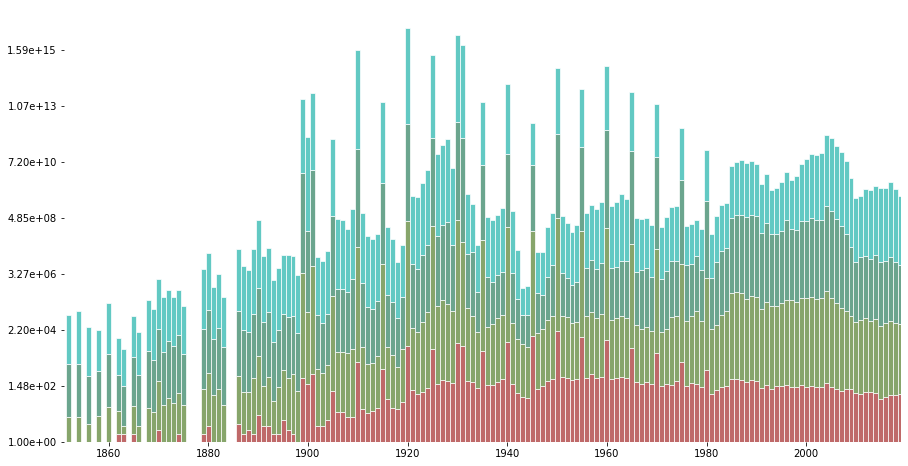

In [18]:
#from matplotlib import rc

import sys
import warnings

if not sys.warnoptions:
    warnings.simplefilter("ignore")

df_tot = df_tot.fillna(0)
 
# y-axis in bold
#rc('font', weight='bold')
 
# Values of each group
bars1 = list(df_tot['log_freq1'])
bars2 = list(df_tot['log_freq2'])
bars3 = list(df_tot['log_freq3'])
bars4 = list(df_tot['log_freq4'])
 
# Heights of bars1 + bars2
bars = np.add(bars1, bars2).tolist()
bars_1 = np.add(bars, bars3).tolist()
 
# The position of the bars on the x-axis
r = list(df_tot['year'])
 
# Names of group and bar width
names = list(df_tot['year'])
barWidth = 1
 
plt.figure(figsize=(15,8))
plt.xlim(1851, 2019)

xs = list(range(0,40,1))
    
# Create brown bars
plt.bar(r, bars1, color='#A52A2A', edgecolor='white', width=barWidth, alpha = 0.7)
# Create green bars (middle), on top of the first ones
plt.bar(r, bars2, bottom=bars1, color='#557f2d', edgecolor='white', width=barWidth, alpha = 0.7)
# Create green bars (middle-top)
plt.bar(r, bars3, bottom=bars, color='#2d7f5e', edgecolor='white', width=barWidth, alpha = 0.7)
# Create green bars (top)
plt.bar(r, bars4, bottom=bars_1, color='#20B2AA', edgecolor='white', width=barWidth, alpha = 0.7)

ax1 = plt.axes()

from decimal import Decimal
from matplotlib.ticker import FuncFormatter, MaxNLocator
def format_fn(tick_val, tick_pos):
    if int(tick_val) in xs:
        return '%.2e' % Decimal(np.exp(int(tick_val)))
    else:
        return ''

ax1.yaxis.set_major_formatter(FuncFormatter(format_fn))
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['bottom'].set_visible(False)
ax1.spines['left'].set_visible(False)
 
# Show graphic
plt.show()


**<span style="font-size:22px;">4. Buildings, Floors by Category, per Year</span>**

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
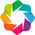

In [20]:
import datetime
import holoviews as hv
from holoviews import opts
hv.extension('bokeh','matplotlib')

#macro_df = pd.read_csv('http://assets.holoviews.org/macro.csv', '\t')
macro_df = df
key_dimensions   = [('yearbuilt', 'Year'), ('floorcat', 'FloorCat')]
value_dimensions = [('log_freq', 'LogFreq')]
macro = hv.Table(macro_df, key_dimensions, value_dimensions)

In [108]:
bars = macro.to.bars(['Year', 'FloorCat'], 'LogFreq', [])
bars.opts(opts.Bars(color=hv.Cycle(['#557f2d','#2d7f5e','#20B2AA','#A52A2A']), show_legend=False, stacked=True, 
                    tools=['hover'], width=1800, xrotation=90))
bars.relabel('Log of Building Count by Floor Category')#.opts(xticks=[(10, '1860'), (30, '1880'), (50, '1900'), (70, '1920'), (90, '1940'), (110, '1960'), (130, '1980'), (150, '2000')])

:Bars   [yearbuilt,floorcat]   (log_freq)

## Part 2: Datashader

Datashader is a library from Anaconda that does away with the need for binning data. It takes in all of your datapoints, and based on the canvas and range returns a pixel-by-pixel calculations to come up with the best representation of the data. In short, this completely eliminates the need for binning your data.

As an example, lets continue with our question above and look at a 2D histogram of YearBuilt vs NumFloors:

In [23]:
yearbins = 200
floorbins = 200

yearBuiltCut = pd.cut(ny['yearbuilt'], np.linspace(ny['yearbuilt'].min(), ny['yearbuilt'].max(), yearbins))
numFloorsCut = pd.cut(ny['numfloors'], np.logspace(1, np.log(ny['numfloors'].max()), floorbins))

xlabels = np.floor(np.linspace(ny['yearbuilt'].min(), ny['yearbuilt'].max(), yearbins))
ylabels = np.floor(np.logspace(1, np.log(ny['numfloors'].max()), floorbins))

fig = go.FigureWidget(
    data = [
        go.Heatmap(z = ny.groupby([numFloorsCut, yearBuiltCut])['bbl'].count().unstack().fillna(0).values,
              colorscale = 'Greens', x = xlabels, y = ylabels)
    ]
)

fig

FigureWidget({
    'data': [{'colorscale': [[0.0, 'rgb(247,252,245)'], [0.125,
                             'r…

This shows us the distribution, but it's subject to some biases discussed in the Anaconda notebook [Plotting Perils](https://anaconda.org/jbednar/plotting_pitfalls/notebook). 

Here is what the same plot would look like in datashader:



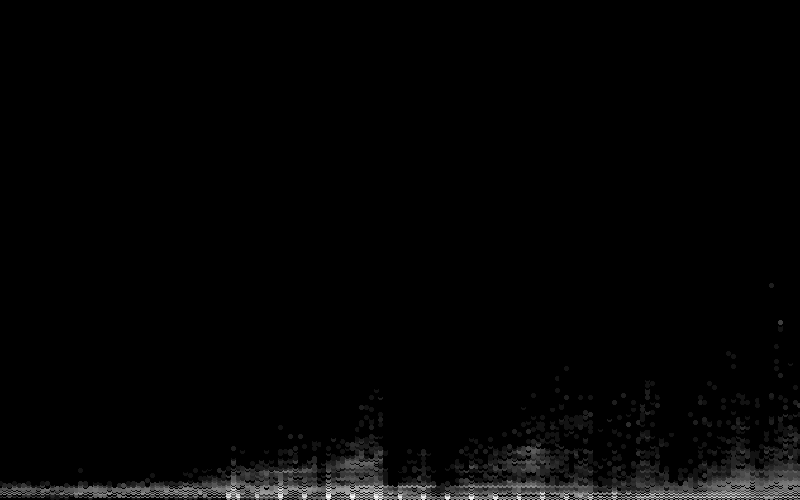

In [24]:
cvs = ds.Canvas(800, 500, x_range = (ny['yearbuilt'].min(), ny['yearbuilt'].max()), 
                                y_range = (ny['numfloors'].min(), ny['numfloors'].max()))
agg = cvs.points(ny, 'yearbuilt', 'numfloors')
view = tf.shade(agg, cmap = cm(Greys9), how='log')
export(tf.spread(view, px=2), 'yearvsnumfloors')

That's technically just a scatterplot, but the points are smartly placed and colored to mimic what one gets in a heatmap. Based on the pixel size, it will either display individual points, or will color the points of denser regions.

Datashader really shines when looking at geographic information. Here are the latitudes and longitudes of our dataset plotted out, giving us a map of the city colored by density of structures:

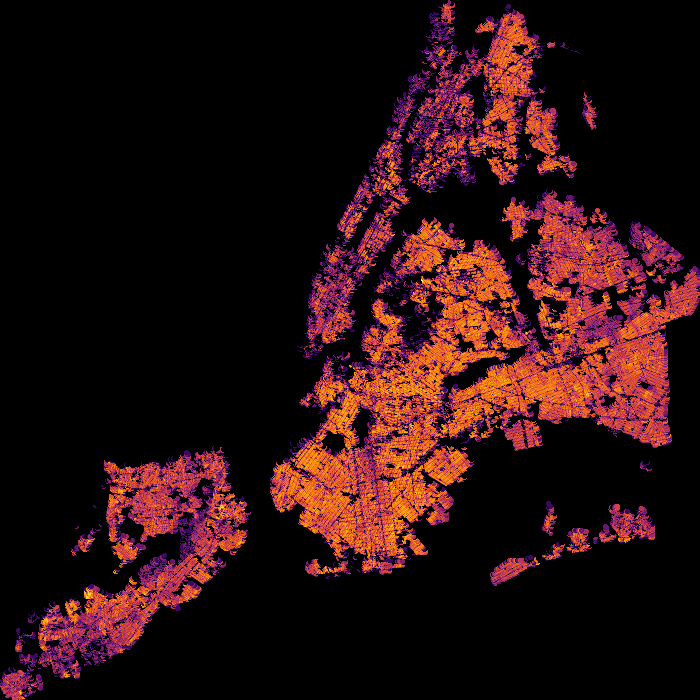

In [25]:
NewYorkCity   = (( 913164.0,  1067279.0), (120966.0, 272275.0))
cvs = ds.Canvas(700, 700, *NewYorkCity)
agg = cvs.points(ny, 'xcoord', 'ycoord')
view = tf.shade(agg, cmap = cm(inferno), how='log')
export(tf.spread(view, px=2), 'firery')

Interestingly, since we're looking at structures, the large buildings of Manhattan show up as less dense on the map. The densest areas measured by number of lots would be single or multi family townhomes.

Unfortunately, Datashader doesn't have the best documentation. Browse through the examples from their [github repo](https://github.com/bokeh/datashader/tree/master/examples). I would focus on the [visualization pipeline](https://anaconda.org/jbednar/pipeline/notebook) and the [US Census](https://anaconda.org/jbednar/census/notebook) Example for the question below. Feel free to use my samples as templates as well when you work on this problem.

### Question

You work for a real estate developer and are researching underbuilt areas of the city. After looking in the [Pluto data dictionary](https://www1.nyc.gov/assets/planning/download/pdf/data-maps/open-data/pluto_datadictionary.pdf?v=17v1_1), you've discovered that all tax assessments consist of two parts: The assessment of the land and assessment of the structure. You reason that there should be a correlation between these two values: more valuable land will have more valuable structures on them (more valuable in this case refers not just to a mansion vs a bungalow, but an apartment tower vs a single family home). Deviations from the norm could represent underbuilt or overbuilt areas of the city. You also recently read a really cool blog post about [bivariate choropleth maps](http://www.joshuastevens.net/cartography/make-a-bivariate-choropleth-map/), and think the technique could be used for this problem.

Datashader is really cool, but it's not that great at labeling your visualization. Don't worry about providing a legend, but provide a quick explanation as to which areas of the city are overbuilt, which areas are underbuilt, and which areas are built in a way that's properly correlated with their land value.

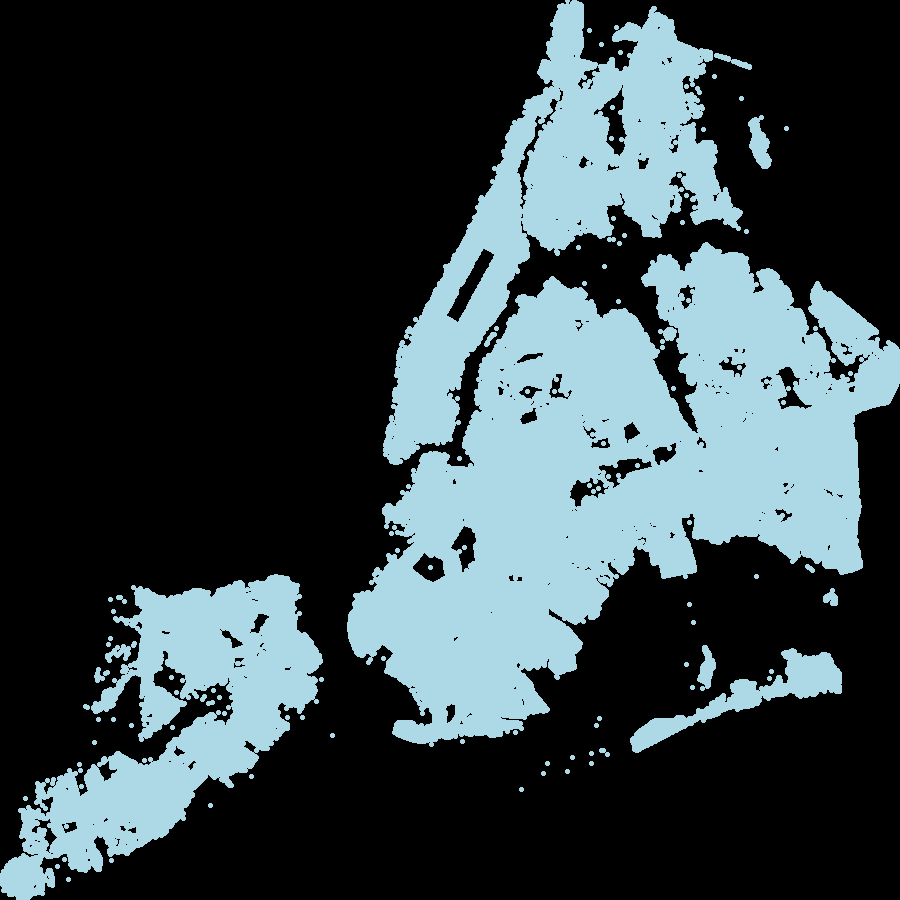

In [27]:
cvs = ds.Canvas(900, 900, *NewYorkCity)
agg = cvs.points(ny, 'xcoord', 'ycoord')
view = tf.shade(agg, cmap = ["lightblue"], how='log')
export(tf.spread(view, px=2), 'firery')

**<span style="font-size:22px;">1. Identifying Underdeveloped/Overdeveloped Sites</span>**

In the plot below, the package `geoviews`, installed via `conda` commands, is used to superimpose two plots: the value of the structure (the difference between the total value assessment and the value assessment of the land) and the value of the land. Values are aggregated by 2010 census blocks.

In [80]:
import geoviews as gv
import geoviews.feature as gf
from holoviews.operation.datashader import dynspread, datashade
from functools import partial
from IPython.core.display import HTML, display
from colorcet import bmw, fire

ny['assessdiff'] = ny['assesstot'] - ny['assessland']


tile_opts  = dict(width=900,height=900,bgcolor='black',show_grid=False)

points1 = hv.Points(gv.Dataset(ny, kdims=['xcoord', 'ycoord'], vdims = ['assessdiff','cb2010']))
points2 = hv.Points(gv.Dataset(ny, kdims=['xcoord', 'ycoord'], vdims = ['assessland','cb2010']))
asstot = dynspread(datashade(points1, cmap = bmw, element_type = gv.Image, aggregator = ds.mean('cb2010'))).opts(style=dict(alpha=0.4), plot=tile_opts)
assland = dynspread(datashade(points2, cmap = fire, element_type = gv.Image, aggregator = ds.mean('cb2010'))).opts(style=dict(alpha=0.4), plot=tile_opts)
(assland * asstot).relabel("Total Assessment with Land Assessment")


:DynamicMap   []
   :Overlay
      .RGB.I  :RGB   [xcoord,ycoord]   (R,G,B,A)
      .RGB.II :RGB   [xcoord,ycoord]   (R,G,B,A)

Underdeveloped areas are lighter in color; overdeveloped areas are darker in color.

**<span style="font-size:22px;">2. Identifying Underdeveloped/Overdeveloped Sites</span>**

Below, the difference between the structure value and the land value is plotted on an interactive map. The difference is grouped by maximum value per 2010 census block.


In [103]:
ny.loc[:, 'x'], ny.loc[:, 'y'] = ds.utils.lnglat_to_meters(ny.longitude,ny.latitude)

ny['y'] = ny['y'].apply(float)
ny['x'] = ny['x'].apply(float)

ny['assessprop'] = ny['assessdiff'] - ny['assessland']
ny['aggval'] = ny.groupby('cb2010')['assessprop'].transform('mean')

In [106]:
import bokeh.plotting as bp
from bokeh.models.tiles import WMTSTileSource
from datashader.transfer_functions import shade, stack
bp.output_notebook()

NewYorkCity = x_range, y_range = ((-8242000, -8210000), (4965000, 4990000))

background = "black"
from datashader.bokeh_ext import InteractiveImage

def base_plot(tools = 'pan, wheel_zoom, reset'):
    p = bp.figure(tools = tools,
        plot_width = int(900), plot_height = int(600),
        x_range = x_range, y_range = y_range, outline_line_color = None,
        min_border = 0, min_border_left = 0, min_border_right = 0,
        min_border_top = 0, min_border_bottom = 0)

    p.axis.visible = False
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None

    return p

def image_callback(x_range, y_range, w, h, color_fn = tf.shade):
    cvs = ds.Canvas(plot_width = w, plot_height = h, x_range = x_range, y_range = y_range)
    agg = cvs.points(ny, 'x', 'y', ds.max('aggval'))    
    image1 = color_fn(agg, cmap=bmw, how='linear', alpha = 65)
    return tf.dynspread(image1, threshold = .9, max_px = 20, shape='square', how='over', name=None)

p = base_plot()

url="http://tile.stamen.com/toner-background/{Z}/{X}/{Y}.png"
tile_renderer = p.add_tile(WMTSTileSource(url = url))
tile_renderer.alpha = 1.0 if background == 'black' else 0.15

InteractiveImage(p, image_callback)

Loading BokehJS ...

In the map above, census blocks adequately developed are dark blue; underdeveloped areas are light purple. Underdeveloped areas will show by clicking the magnifying glass and zooming in to the image.

This interactive map allows the assessment of underdevelopment and overdevelopment to be determined by plot resolution.
